In [1]:
import os
import h5py
import numpy as np
import pandas as pd
%matplotlib inline  
from metrics_helper import do_the_thing
from data_helpers import grouper
from TempConv import evaluate_timeseries

Using Theano backend.
WARNING (theano.sandbox.cuda): The cuda backend is deprecated and will be removed in the next release (v0.10).  Please switch to the gpuarray backend. You can get more information about how to switch at this URL:
 https://github.com/Theano/Theano/wiki/Converting-to-the-new-gpu-back-end%28gpuarray%29

ERROR (theano.sandbox.cuda): ERROR: Not using GPU. Initialisation of device gpu failed:
initCnmem: cnmemInit call failed! Reason=CNMEM_STATUS_OUT_OF_MEMORY. numdev=1



RuntimeError: Cuda error: kernel_reduce_ccontig_node_m23eb44cb0bd6afa880a56f8b1f6a7d7f_0: out of memory. (grid: 1 x 1; block: 256 x 1 x 1)

Apply node that caused the error: GpuCAReduce{add}{1}(<CudaNdarrayType(float32, vector)>)
Toposort index: 0
Inputs types: [CudaNdarrayType(float32, vector)]
Inputs shapes: [(10000,)]
Inputs strides: [(1,)]
Inputs values: ['not shown']
Outputs clients: [[HostFromGpu(GpuCAReduce{add}{1}.0)]]

HINT: Re-running with most Theano optimization disabled could give you a back-trace of when this node was created. This can be done with by setting the Theano flag 'optimizer=fast_compile'. If that does not work, Theano optimizations can be disabled with 'optimizer=None'.
HINT: Use the Theano flag 'exception_verbosity=high' for a debugprint and storage map footprint of this apply node.

In [ ]:
bs = 256
eps = 8
lr = 0.0005
filter_length = 2
nb_filter = 5
window = 80
offset = 10
nb_test = 3

In [ ]:
all_head_data_h5 = h5py.File('all_head_data.hdf5', 'r')
idx_start, idx_stop = [6,9]
y = np.asarray([np.asarray(all_head_data_h5[key]) for key in all_head_data_h5.keys()][0:9]).T[:,idx_start:idx_stop]
print('y shape: ', y.shape)

head_data_keys = list(all_head_data_h5.keys())[0:9][idx_start:idx_stop]
head_data_keys_int = ['yaw_abs', 'roll_abs', 'pitch_abs']
print('head_data_keys intuitive: ', head_data_keys_int)

In [ ]:
# sorted spike rates
spikes_file = h5py.File('datasets/GRat31_636061_all_sorted_spikes.hdf5', 'r')
spikes_data = np.asarray(spikes_file['sorted_spikes']).T

# concatenate all neural data
#neural_data = np.concatenate((lfp_data, spikes_data), axis=0)
print('spikes_data', spikes_data.shape)

tetrodes = grouper(spikes_data, spikes_data.shape[0])

In [5]:
# lfp_file = h5py.File('lfp_power.hdf5', 'r')
# neural_data = np.asarray(lfp_file['lfp_power']) # iterate through powerbands
# tetrode_groups = grouper(neural_data, 24)

In [6]:
tetrode_groups[0].T.shape

(80223, 24)

In [7]:
stats = []

Train on 39747 samples, validate on 39746 samples
Epoch 1/8
39747/39747 [==============================] - 6s - loss: 70.9224 - mean_squared_error: 9938.4220 - val_loss: 60.0595 - val_mean_squared_error: 7356.3693

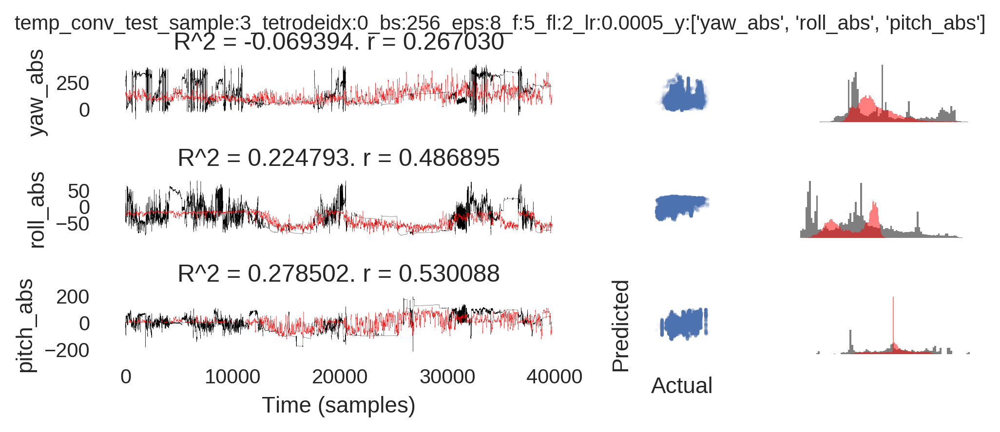

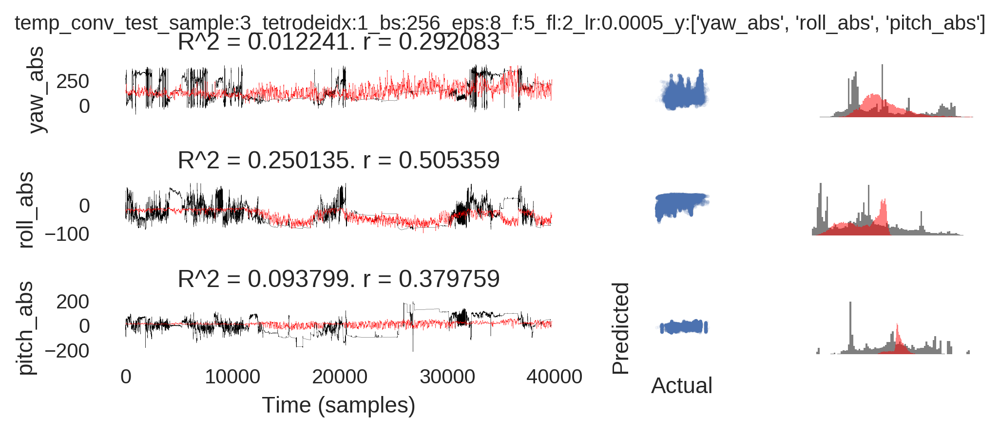

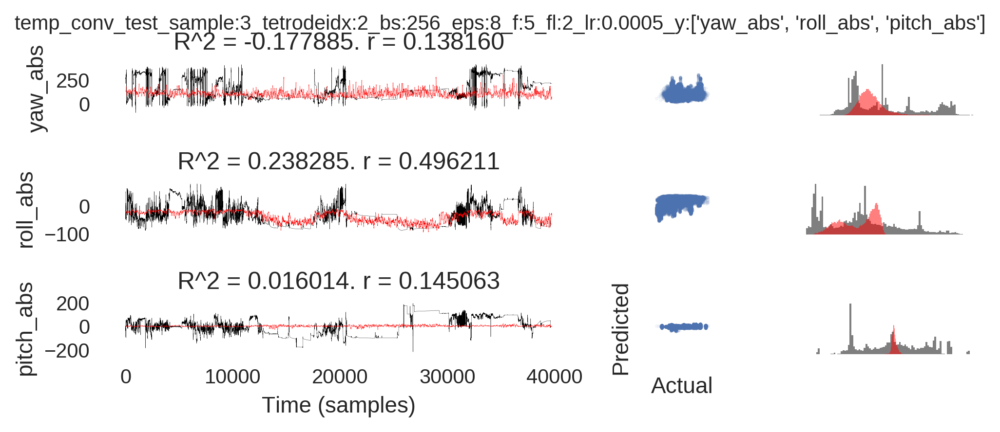

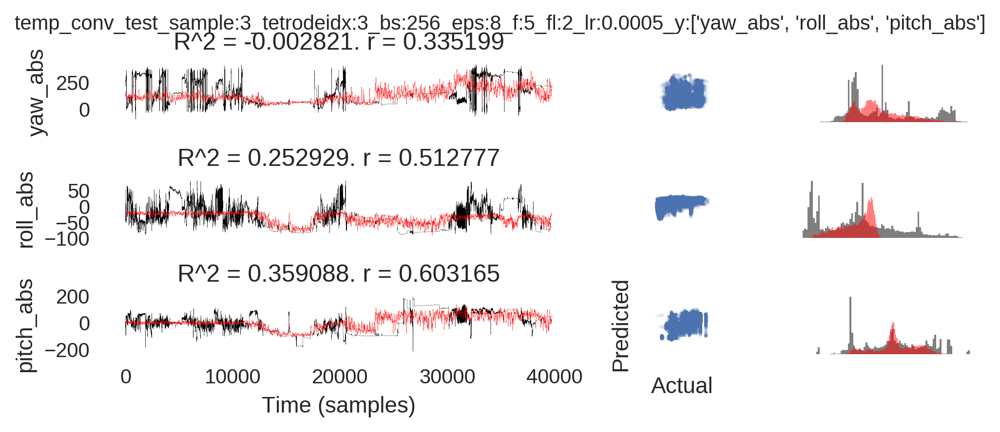

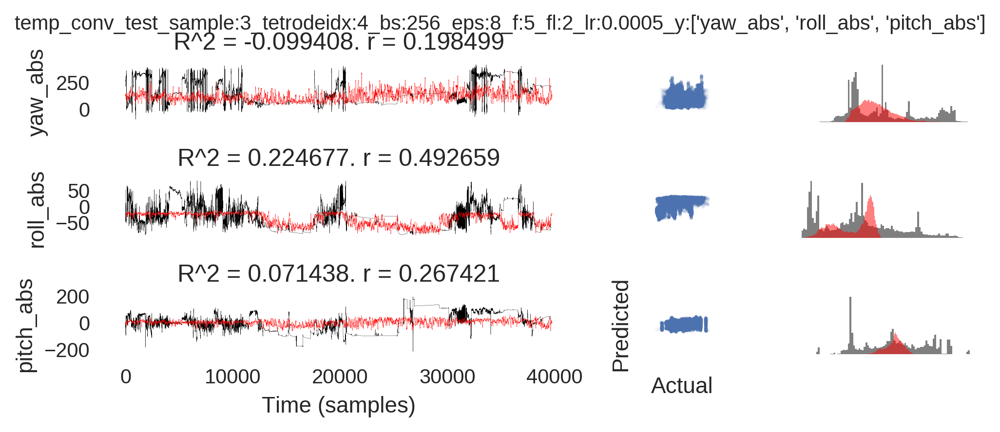

...

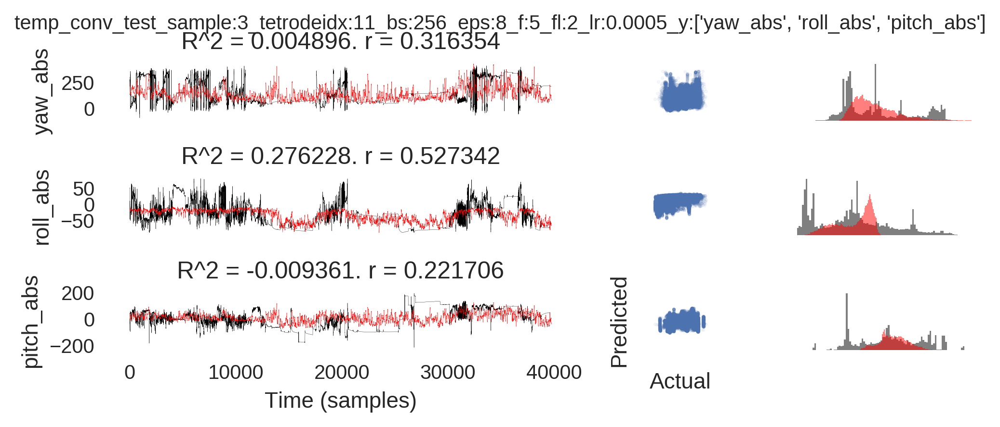

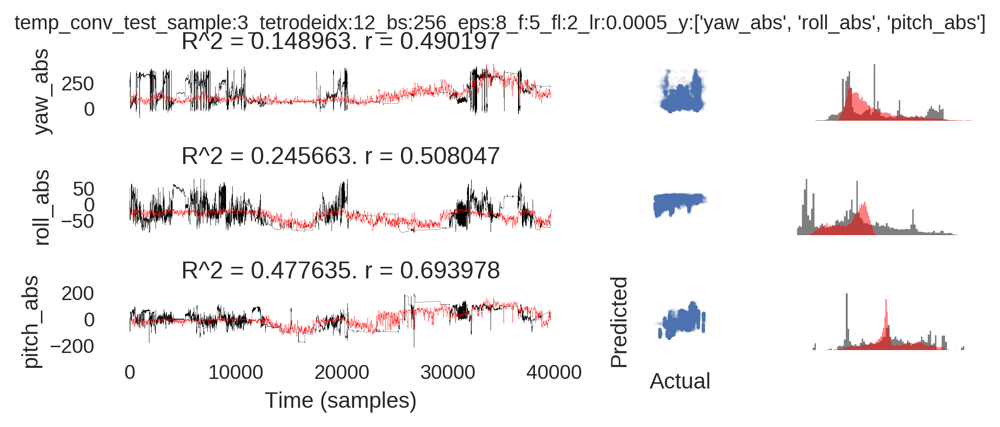

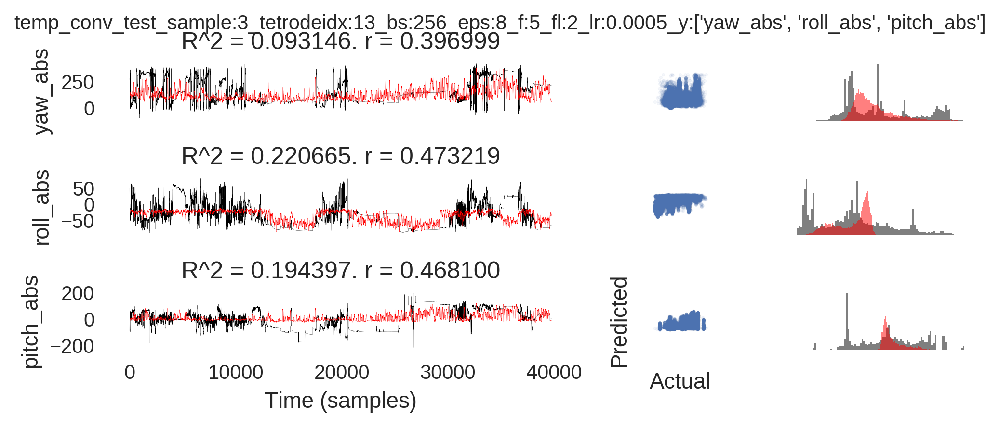

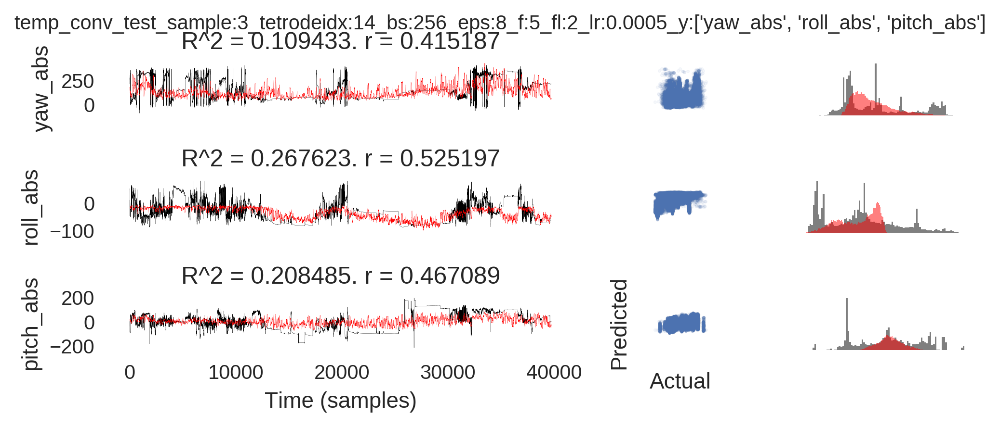

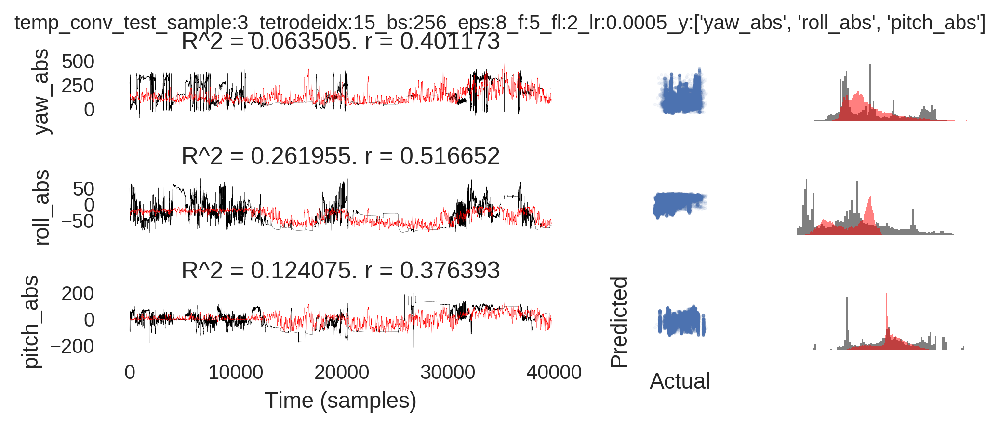

In [8]:
for i in range(16):
    tetrode_data = tetrode_groups[i].T
    
    model, X_train, X_test, y_train, y_test = evaluate_timeseries(
        tetrode_data, 
        y, 
        window, 
        offset, 
        bs=bs, 
        eps=eps, 
        lr=lr,
        filter_length=filter_length,
        nb_filter=nb_filter
    )

    y_test_hat = model.predict(X_test)

    params = 'sample:{}_tetrodeidx:{}_bs:{}_eps:{}_f:{}_fl:{}_lr:{}_y:{}'.format(
        nb_test,
        i, 
        bs, 
        eps, 
        nb_filter, 
        filter_length, 
        lr, 
        head_data_keys_int
    )
    print(params)
    R2s, rs = do_the_thing(
        y_test, 
        y_test_hat, 
        head_data_keys_int, 
        'temp_conv_test_{}'.format(params)
    )
    stats.append([R2s,rs])

In [9]:
R2s = pd.DataFrame([stat[0] for stat in stats])
R2s.columns = ['yaw','roll','pitch']
R2s.to_csv('Tetrode_R2s_{}.csv'.format(nb_test))

Rs = pd.DataFrame([stat[1] for stat in stats])
Rs.columns = ['yaw','roll','pitch']
R2s.to_csv('Tetrode_Rs_{}.csv'.format(nb_test))

In [10]:
Rs

,yaw,roll,pitch
0,0.267030,0.486895,0.530088
1,0.292083,0.505359,0.379759
2,0.138160,0.496211,0.145063
3,0.335199,0.512777,0.603165
4,0.198499,0.492659,0.267421
5,0.613240,0.500338,0.591012
6,0.512024,0.502446,0.589660
7,0.353884,0.434383,0.378070
8,0.198929,0.502358,0.085014
9,0.210874,0.473328,0.171448


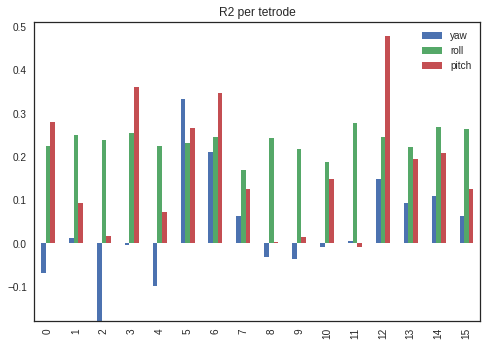

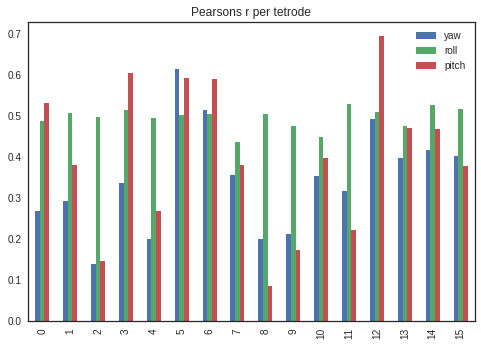

In [11]:
R2s.plot.bar(title='R2 per tetrode')
Rs.plot.bar(title='Pearsons r per tetrode')